# Un analisis estadistico de datos con Componentes Principales y Analisis Factorial
## Eduardo Manuel Ceja Cruz 
### Miniproyecto 2

En esta libreta se analizaran los datos de Heart Disease que se encuentran en [kaggle](https://www.kaggle.com/ronitf/heart-disease-uci). El objetivo de esta libreta es hacer estos dos analisis en estos datos para ver si se pueden determinar cuales son las causas mas comunes para las 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import copy

In [2]:
datos = pd.read_csv("heart.csv")
datos

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


In [3]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [4]:
labels = datos.target
labels

0      1
1      1
2      1
3      1
4      1
      ..
298    0
299    0
300    0
301    0
302    0
Name: target, Length: 303, dtype: int64

In [5]:
datos_no_label = datos.drop(columns="target")
datos_no_label

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3


In [6]:
datos_no_label.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000


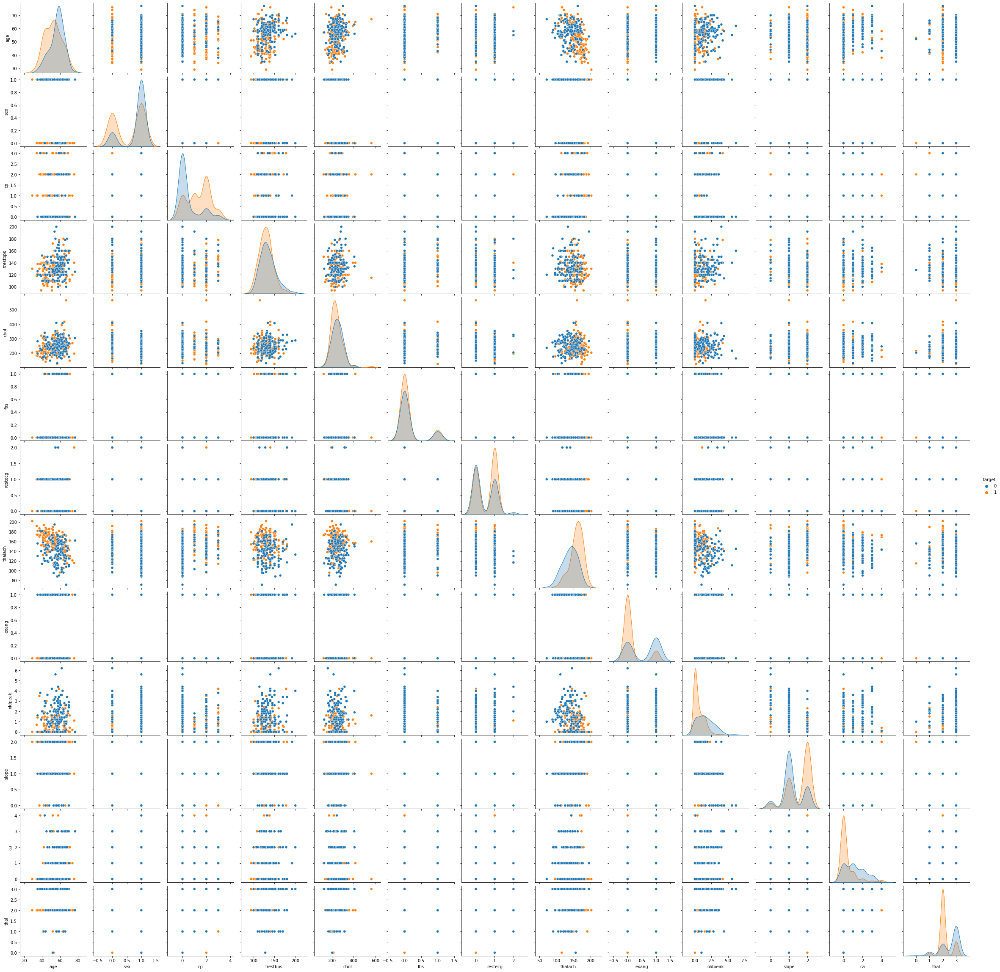

In [7]:
sns.pairplot(datos, hue = 'target', diag_kind="kde")

## Analisis de Componentes Principales
### A mano

Antes de poder hacer algo con los datos, tenemos que preprocesar los datos. Para esto lo que voy a hacer es estandarizarlos usando este metodo:


$$ z_i = \frac{x_i - \mu_i}{\sqrt{\sigma_{i,i}}}$$

Generalizando,

$$Z = (V^{1/2})^{-1}(X-M)$$

In [8]:
datos_pca = copy.copy(datos)
datos_pca = (datos_pca-datos_pca.mean())/datos_pca.std() #raiz de varianza = desviacion estandar
datos_pca

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,0.950624,0.679881,1.969864,0.762694,-0.255910,2.390484,-1.004171,0.015417,-0.69548,1.085542,-2.270822,-0.713249,-2.145324,0.913019
1,-1.912150,0.679881,1.000921,-0.092585,0.072080,-0.416945,0.897478,1.630774,-0.69548,2.119067,-2.270822,-0.713249,-0.512075,0.913019
2,-1.471723,-1.465992,0.031978,-0.092585,-0.815424,-0.416945,-1.004171,0.975900,-0.69548,0.310399,0.974740,-0.713249,-0.512075,0.913019
3,0.179877,0.679881,0.031978,-0.662770,-0.198030,-0.416945,0.897478,1.237849,-0.69548,-0.206364,0.974740,-0.713249,-0.512075,0.913019
4,0.289984,-1.465992,-0.936965,-0.662770,2.078611,-0.416945,0.897478,0.582975,1.43311,-0.378618,0.974740,-0.713249,-0.512075,0.913019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.289984,-1.465992,-0.936965,0.477601,-0.101562,-0.416945,0.897478,-1.163356,1.43311,-0.723126,-0.648041,-0.713249,1.121174,-1.091653
299,-1.031296,0.679881,1.969864,-1.232956,0.342190,-0.416945,0.897478,-0.770432,-0.69548,0.138144,-0.648041,-0.713249,1.121174,-1.091653
300,1.501157,0.679881,-0.936965,0.705675,-1.027653,2.390484,0.897478,-0.377507,-0.69548,2.032940,-0.648041,1.242538,1.121174,-1.091653
301,0.289984,0.679881,-0.936965,-0.092585,-2.223854,-0.416945,0.897478,-1.512623,1.43311,0.138144,-0.648041,0.264644,1.121174,-1.091653


Ahora que ya tenemos nuestros datos estandarizados, podemos realizar el PCA.

Primero hay que sacar la matriz de covarianza

In [9]:
# pd.plotting.scatter_matrix(datos_pca, diagonal='kde', alpha=0.8, figsize=(15,15), s =200, marker='o')
# plt.title("Scatter Plot Matrix con sus  funcion de densidad de probabilidad")
# plt.show()

Ahora, para continuar con el analisis, tenemos que conseguir la matriz de correlacion

In [10]:
corr_matrix = datos_pca.corr()
corr_matrix

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001,-0.225439
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041,-0.280937
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736,0.433798
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210,-0.144931
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803,-0.085239
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019,-0.028046
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981,0.137230
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439,0.421741
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754,-0.436757
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244,-0.430696


Text(0.5, 1.0, 'La matriz de correlacion')

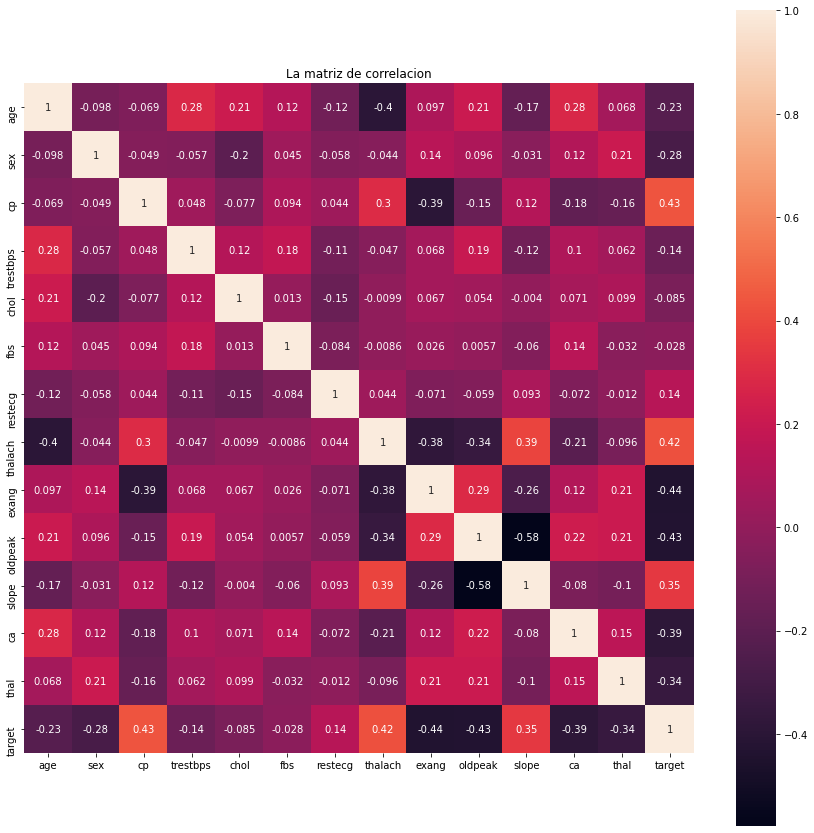

In [11]:
plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, vmax= 1, square= True, annot=True)
plt.title('La matriz de correlacion')

Ya que la tenemos, calculamos los eigenvalores y eigenvectores

In [12]:
evalues, evectors = np.linalg.eig(corr_matrix)

In [13]:
evalues

array([3.30147528, 1.57216477, 1.23202899, 1.20663891, 0.36793946,
       0.37187613, 0.43003362, 1.02202905, 0.97016841, 0.53440229,
       0.86323471, 0.7760929 , 0.72919471, 0.62272074])

In [14]:
evectors

array([[-0.25395987, -0.44468536, -0.06690997, -0.06635435, -0.14797767,
         0.19228174, -0.52479585,  0.30674004,  0.12641772, -0.13050535,
        -0.21711854,  0.25177975,  0.39611172, -0.00765511],
       [-0.12203775,  0.39157094,  0.55956069,  0.0812111 ,  0.23326173,
         0.04637046, -0.08310562, -0.05612852, -0.0620435 , -0.23921669,
        -0.15092487,  0.16648215,  0.23014486,  0.53002082],
       [ 0.27455103, -0.26756302,  0.22733463,  0.37876048, -0.27265906,
         0.02340343,  0.22270369, -0.15936941,  0.19839869,  0.53602415,
        -0.21899636, -0.05151167,  0.3122545 ,  0.18222332],
       [-0.14736218, -0.44342889,  0.19892862,  0.08977285,  0.16655686,
         0.00930944,  0.2097804 , -0.18688032,  0.18134578, -0.04901491,
         0.32566901,  0.60454889, -0.34193253,  0.05930643],
       [-0.09219679, -0.35896621, -0.1807147 , -0.50929857,  0.10061315,
        -0.01407735,  0.1540306 , -0.32139792,  0.10343411, -0.10217446,
         0.05236944, -0.37

In [15]:
sum(evalues)

14.000000000000002

Vemos que la suma de los eigenvalores es lo mismo que el numero de las variables. Ahora lo que hacemos es ver cuales son los que aportan mas varianza

In [16]:
varianza_explicada = evalues/np.sum(evalues)
varianza_explicada

array([0.23581966, 0.11229748, 0.08800207, 0.08618849, 0.02628139,
       0.02656258, 0.03071669, 0.07300207, 0.06929774, 0.03817159,
       0.06165962, 0.05543521, 0.05208534, 0.04448005])

Tambien podemos visualizarlo para que sea mas facil ver cuanto componentes usar

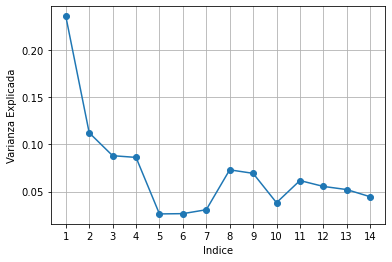

In [17]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), varianza_explicada,marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

Pero lo que hay que hacer es ordenarlos de mayor a menor, entonces eso es lo que tenemos que hacer

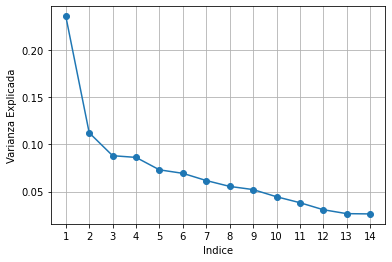

In [18]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), sorted(varianza_explicada, reverse = True),marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

Con esta visualizacion, podemos determinar cuantos componentes queremos. En este caso decidire por los primeros 4. Para esto, debemos de recordar el modelo de los componentes principales

$$Y = AX$$

Lo cual podemos ver como $$Y = e*X$$
donde $e$ son los eigenvectores

In [19]:
pca_vectors = evectors[:, :4]

In [20]:
y1 = datos_pca.dot(pca_vectors[:, 0])
y2 = datos_pca.dot(pca_vectors[:, 1])
y3 = datos_pca.dot(pca_vectors[:, 2])
y4 = datos_pca.dot(pca_vectors[:, 3])

In [21]:
y1

0      0.051654
1      0.816091
2      2.054201
3      1.899900
4      0.767102
         ...   
298   -1.482834
299    0.140094
300   -2.677343
301   -2.167273
302    0.365156
Length: 303, dtype: float64

Ya tenemos nuestros componentes princiapeles, pero asi en numeros no dicen mucho, por lo que vamos a intentar hacer una visualizacion

In [22]:
list(labels.unique())

[1, 0]

In [23]:
def plot_scatter(y1,y2,xlabel, ylabel):
    fig, ax = plt.subplots(figsize=(15,8))
    label_unique = list(labels.unique())
    label_colors = ["r", "g"]

    for i,label in enumerate(labels.to_list()):
        plt.scatter(y1[i], y2[i], label = label, s = 20, c=label_colors[label_unique.index(label)])
        ax.annotate(str(i+1), (y1[i], y2[i]))
    from collections import OrderedDict
    handles, plot_labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(plot_labels, handles))
    plt.legend(by_label.values(), f"{by_label.keys()} ", prop={'size': 15}, loc=4)
    # plt.legend(by_label.values(), ["Muerto", 'No muerto'])

    ax.set_xlabel(f"Componenete principal {xlabel}")
    ax.set_ylabel(f"Componente principal {ylabel}")
    ax.axhline(y=0, color="grey", linestyle="--")
    ax.axvline(x=0, color="grey", linestyle="--")
    plt.grid(True)

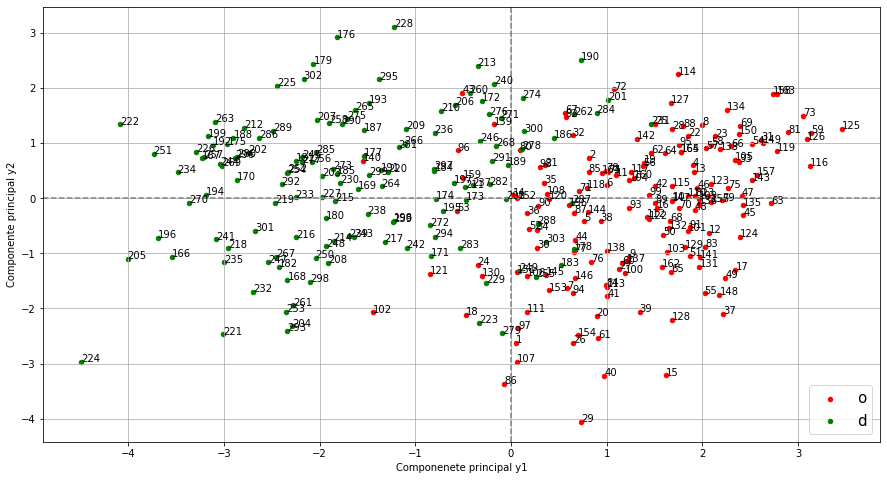

In [24]:
plot_scatter(y1, y2, "y1", "y2")

Donde 1 es que si sufrio un ataque cardiaco y 0 que no lo sufrio. Para tener una mejor comparacion, debemos de graficar todos contra todos. Al final nos van a quedar 6 graficas

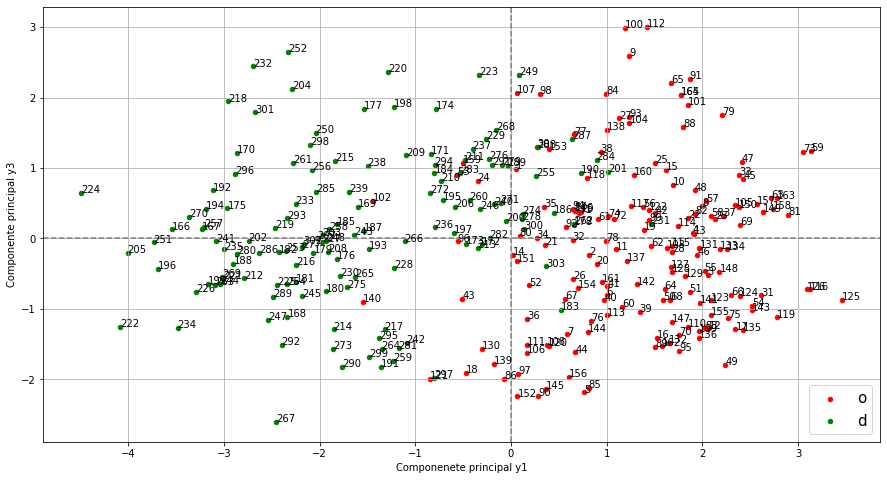

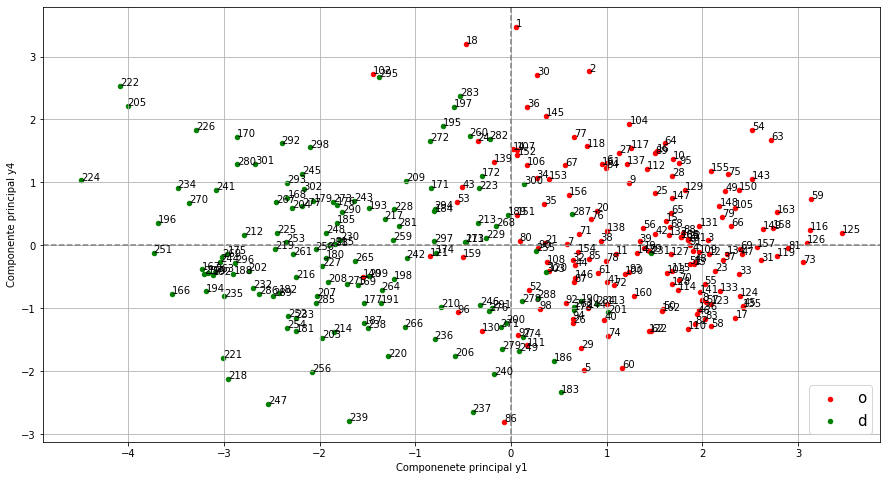

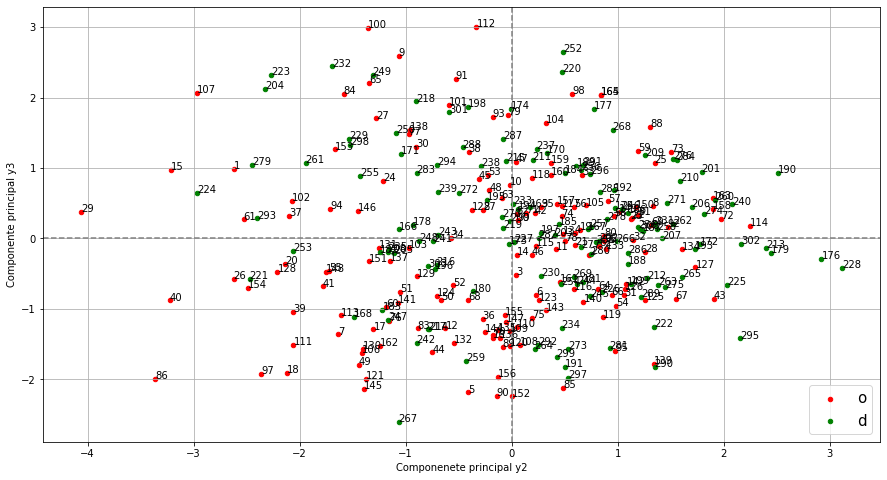

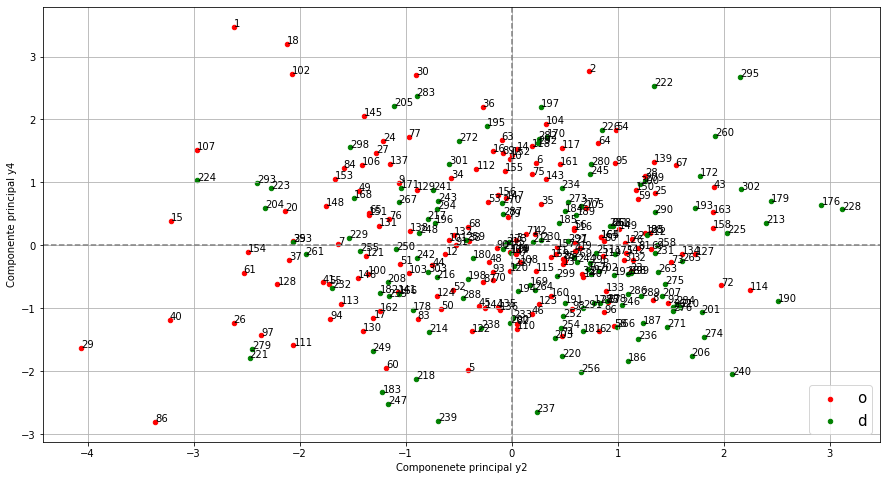

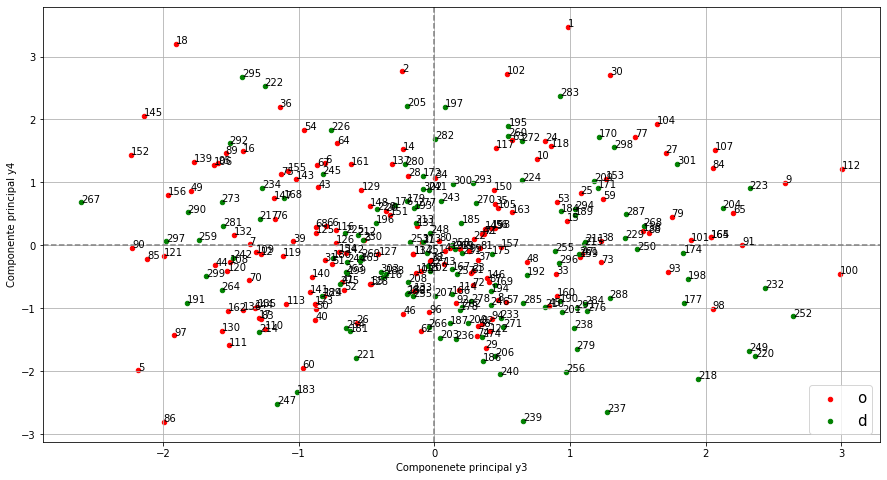

In [25]:
plot_scatter(y1, y3, "y1", "y3")
plot_scatter(y1, y4, "y1", "y4")
plot_scatter(y2, y3, "y2", "y3")
plot_scatter(y2, y4, "y2", "y4")
plot_scatter(y3, y4, "y3", "y4")

## Analisis de componentes principales
### con sklearn

In [26]:
from sklearn.decomposition import PCA

In [27]:
pca = PCA().fit(datos_pca)

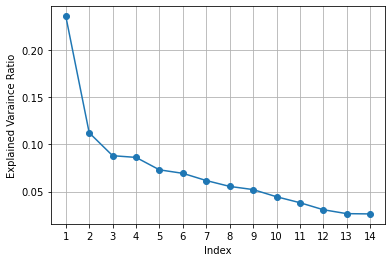

In [28]:
plt.plot(np.arange(1, datos_pca.shape[1] +1), pca.explained_variance_ratio_, marker = 'o')
plt.xlabel('Index')
plt.ylabel('Explained Varaince Ratio')
plt.xticks(np.arange(1, datos_pca.shape[1] + 1))
plt.grid(True)
plt.show()

In [29]:
pca = PCA(n_components=4)
pca = pca.fit_transform(datos_pca)
pca

array([[-0.05165366,  2.61968839,  0.98841876,  3.47358134],
       [-0.81609057, -0.72916834, -0.23553878,  2.76297477],
       [-2.05420114, -0.03903387, -0.51898013,  0.08106435],
       ...,
       [ 2.67734304,  0.59203956,  1.78805709,  1.29811423],
       [ 2.1672727 , -2.1634132 , -0.08138103,  0.88877375],
       [-0.36515559,  0.78661481, -0.39520614, -0.421181  ]])

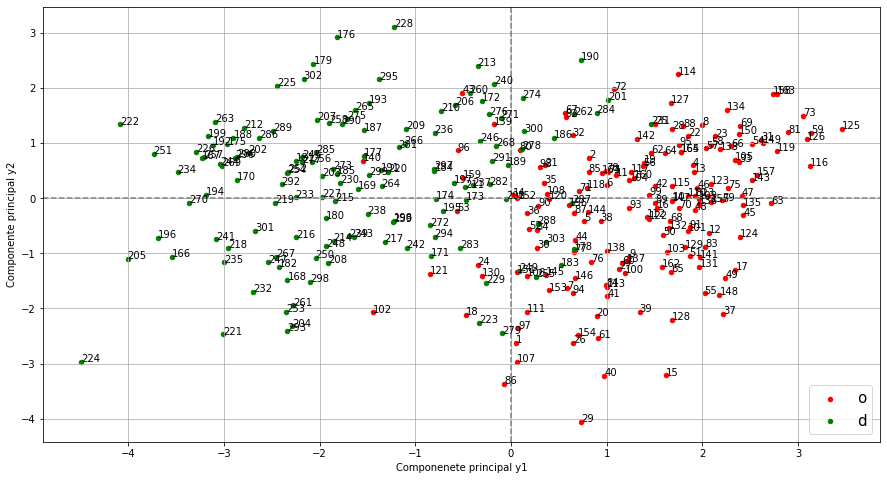

In [30]:
y1 = - pca[:, 0]
y2 = - pca[:,1]
plot_scatter(y1,y2, "y1", "y2")

es la misma grafica, ~~y con menos pasos~~. Lo unico distinto que se tuvo que hacer, fue que hay que multiplicar los resultados por -1, ya que salen con el signo contrario.

## Analisis Factorial
### a mano
#### de nuevo
¿qué podria salir mal?

Recordando el modelo del Analisis Factorial:

$$X = M + LF + U$$

Esta parte va a ser un poco mas corta, porque, sorpresa, podemos usar la matriz de correlacion que ya tenemos asi como los eigenvalores y eigenvectores de esa matriz. 

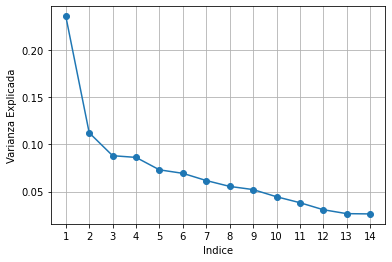

In [31]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), sorted(varianza_explicada, reverse = True),marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

viendo la grafica, tomamos igual los primeros 4. Recordemos que para calcular la matriz de pesos $L$, tenemos que hacer la siguente multiplicacion:

$$\sqrt{\lambda_i} *$$

In [32]:
af_vectors = evectors[:, :4]
af_values = evalues[:4]

In [33]:
af_values = np.sqrt(af_values)

In [34]:
l = af_values * af_vectors; l

array([[-0.46144413, -0.55757316, -0.07426793, -0.07288834],
       [-0.22174213,  0.49097512,  0.62109447,  0.08920805],
       [ 0.49885819, -0.33548656,  0.25233417,  0.41605747],
       [-0.26775652, -0.55599772,  0.2208044 ,  0.09861288],
       [-0.16752121, -0.45009336, -0.20058754, -0.55944979],
       [-0.09616996, -0.38364909,  0.51950488,  0.17386526],
       [ 0.20336604,  0.26744509, -0.22529148,  0.20892337],
       [ 0.6658255 ,  0.00279606,  0.29678214, -0.13893486],
       [-0.60991709,  0.25718562, -0.13571613, -0.11032566],
       [-0.67187483, -0.032631  , -0.09828631,  0.4063371 ],
       [ 0.59136056,  0.04950769,  0.21738184, -0.54677902],
       [-0.47528205, -0.1168181 ,  0.33811999, -0.21142004],
       [-0.40446628,  0.24085249,  0.26759043, -0.25898478],
       [ 0.79637971, -0.18950909, -0.1345643 ,  0.12788393]])

In [35]:
for i,j in enumerate(l):
    print(f"x{i+1} = {j[0]:.2f}f1 + {j[1]:.2f}f2 + {j[2]:.2f}f3 + {j[3]:.2f}f4")

x1 = -0.46f1 + -0.56f2 + -0.07f3 + -0.07f4
x2 = -0.22f1 + 0.49f2 + 0.62f3 + 0.09f4
x3 = 0.50f1 + -0.34f2 + 0.25f3 + 0.42f4
x4 = -0.27f1 + -0.56f2 + 0.22f3 + 0.10f4
x5 = -0.17f1 + -0.45f2 + -0.20f3 + -0.56f4
x6 = -0.10f1 + -0.38f2 + 0.52f3 + 0.17f4
x7 = 0.20f1 + 0.27f2 + -0.23f3 + 0.21f4
x8 = 0.67f1 + 0.00f2 + 0.30f3 + -0.14f4
x9 = -0.61f1 + 0.26f2 + -0.14f3 + -0.11f4
x10 = -0.67f1 + -0.03f2 + -0.10f3 + 0.41f4
x11 = 0.59f1 + 0.05f2 + 0.22f3 + -0.55f4
x12 = -0.48f1 + -0.12f2 + 0.34f3 + -0.21f4
x13 = -0.40f1 + 0.24f2 + 0.27f3 + -0.26f4
x14 = 0.80f1 + -0.19f2 + -0.13f3 + 0.13f4


In [36]:
L = l@l.T
pd.DataFrame(L)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.534647,-0.224063,-0.092203,0.409978,0.383936,0.207034,-0.241458,-0.320715,0.156164,0.305909,-0.276775,0.274749,0.051349,-0.261147
1,-0.224063,0.683943,-0.081494,-0.067671,-0.358329,0.171135,-0.035076,0.025667,0.167382,0.108165,-0.020585,0.239179,0.351035,-0.341804
2,-0.092203,-0.081494,0.598187,0.149702,-0.215947,0.284161,0.041802,0.348298,-0.470692,-0.179964,0.105757,-0.200551,-0.322804,0.480110
3,0.409978,-0.067671,0.149702,0.439306,0.195646,0.370912,-0.232294,-0.128004,-0.020532,0.216410,-0.191787,0.246020,0.007931,-0.124971
4,0.383936,-0.358329,-0.215947,0.195646,0.583867,-0.012687,-0.226135,-0.094602,0.075361,-0.080370,0.140943,0.182655,0.050564,-0.092666
5,0.207034,0.171135,0.284161,0.370912,-0.012687,0.456550,-0.202878,0.064919,-0.129700,0.096721,-0.058000,0.229421,0.040481,-0.051555
6,-0.241458,-0.035076,0.041802,-0.232294,-0.226135,-0.202878,0.207290,0.040265,-0.047727,-0.038327,-0.029706,-0.248245,-0.132234,0.168307
7,-0.320715,0.025667,0.348298,-0.128004,-0.094602,0.064919,0.040265,0.550714,-0.430329,-0.533067,0.534363,-0.187060,-0.153232,0.472016
8,0.156164,0.167382,-0.470692,-0.020532,0.075361,-0.129700,-0.047727,-0.430329,0.468734,0.369905,-0.317127,0.237275,0.300891,-0.530311
9,0.305909,0.108165,-0.179964,0.216410,-0.080370,0.096721,-0.038327,-0.533067,0.369905,0.627251,-0.642478,0.204002,0.132356,-0.463694


In [37]:
comunalidades = [L[i,i] for i in range(len(L))]
comunalidades

[0.5346469486073041,
 0.6839425615051858,
 0.598187076872339,
 0.43930610199323333,
 0.5838668160463639,
 0.45654973083131767,
 0.20728984694454755,
 0.5507139468985145,
 0.4687339244219409,
 0.6272506137557977,
 0.6983804831418381,
 0.39856305974465595,
 0.36028065362514694,
 0.70459619344792]

In [38]:
psi = np.zeros_like(L)
psi

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [39]:
for i in range(psi.shape[0]):
    psi[i][i] = 1 - comunalidades[i]

In [40]:
pd.DataFrame(psi)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.465353,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
1,0.000000,0.316057,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.401813,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.560694,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.416133,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.54345,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.79271,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.449286,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.531266,0.000000,0.00000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.372749,0.00000,0.000000,0.000000,0.000000


In [41]:
pd.DataFrame((corr_matrix.values - (L - psi)))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.930706,0.125616,0.023550,-0.130627,-0.170258,-0.085727,0.125248,-0.077807,-0.059363,-0.095897,0.107960,0.001577,0.016652,0.035708
1,0.125616,0.632115,0.032142,0.010902,0.160417,-0.126103,-0.023121,-0.069687,-0.025718,-0.012073,-0.010126,-0.120918,-0.140994,0.060867
2,0.023550,0.032142,0.803626,-0.102095,0.139043,-0.189717,0.002619,-0.052536,0.076412,0.030734,0.013959,0.019498,0.161069,-0.046312
3,-0.130627,0.010902,-0.102095,1.121388,-0.072472,-0.193382,0.118191,0.081306,0.088148,-0.023193,0.070313,-0.144631,0.054279,-0.019961
4,-0.170258,0.160417,0.139043,-0.072472,0.832266,0.025980,0.075095,0.084662,-0.008338,0.134322,-0.144981,-0.112144,0.048239,0.007427
5,-0.085727,-0.126103,-0.189717,-0.193382,0.025980,1.086901,0.118689,-0.073486,0.155365,-0.090973,-0.001895,-0.091442,-0.072500,0.023509
6,0.125248,-0.023121,0.002619,0.118191,0.075095,0.118689,1.585420,0.003859,-0.023006,-0.020443,0.122751,0.176202,0.120252,-0.031078
7,-0.077807,-0.069687,-0.052536,0.081306,0.084662,-0.073486,0.003859,0.898572,0.051517,0.188880,-0.147579,-0.026117,0.056793,-0.050275
8,-0.059363,-0.025718,0.076412,0.088148,-0.008338,0.155365,-0.023006,0.051517,1.062532,-0.081683,0.059378,-0.121536,-0.094137,0.093554
9,-0.095897,-0.012073,0.030734,-0.023193,0.134322,-0.090973,-0.020443,0.188880,-0.081683,0.745499,0.064941,0.018681,0.077888,0.032998


## Pero y varimax?
### yo creo que no lo invitaron
#### igual que a Maximum Likelihood
##### se pusieron a lloran juntos

In [42]:
def maximum_likelihood():
    pass

In [43]:
def varimax():
    pass

## Analisis Factorial
### mira mama, sin manos
#### pero con sklearn

In [44]:
from sklearn.decomposition import FactorAnalysis